# 1D simulation of a valley glacier

*This notebook creates and runs a one-dimensional simulation model of a hypothetical valley glacier.*

(Author: Greg Tucker, University of Colorado, Boulder. Version 1.0, March 2020)

## How do I run the model?

First, run the complete notebook (Cell => Run All).

Next, page down and read through the sections "An example model run with default parameters," "An example model run with a different ELA," and "Example of plotting the ice thickness and discharge." These sections provide examples of how to run the model and plot its output.

Then, continue on to the section "Your turn". Use the cells below that section to type your commands.

## What to see and do?

- Watch the movies in the example runs. The movies show a longitudinal profile of the ice thickness, as well as the equilibrium line altitude (ELA). Approximately how long do these run take to reach a steady state in which the glacier length and thickness become constant in time?

- Experiment with raising and lowering the ELA. What happens to the glacier?

- Use the model to explore and discuss the influence of the equilibrium line altitude (relative to the valley altitude) on the size and speed of a valley glacier. Your job here is to run the model to steady state for different values of the ELA. Then make plots of the following quantities as a function of ELA: glacier length, maximum thickness, maximum velocity, maximum ice discharge, and volume. At the end of each run, the program will plot ice volume (per width) as a function of time; use this plot to determine whether each run has reached steady state (unchanging volume). The program will also report final values of length, maximum thickness, maximum velocity, maximum unit discharge, and volume per unit width. Explain why these five variables increase with decreasing ELA, all else being equal.

- HINTS: (1) For the default model setup, a reasonable range for ELA values to explore might be 675 to 975 m. (2) To check whether the model has reached steady state, either verify that it reaches a point where isn’t changing visibly as time advances, or compare its final Q(x) with the analytical solution.

## What's under the hood?

The model uses the "thin ice" approximation to represent a valley glacier in a valley of constant (and relatively large) width. The glacier lies in valley with a uniform slope angle. For these conditions, the flow law is:

$q = U_s H + \frac{A}{5} (\rho_i g S)^3 H^5$. 

Here, $q$ is the ice discharge per unit glacier width, $U_s$ is the sliding velocity, $H$ is the glacier thickness at a particular location and time, $x$ is distance from the headwall (left edge), $\rho_i$ is the ice density, $g$ is gravitational acceleration, and $S$ is the ice surface slope gradient (positive downhill). Note that the default value of sliding velocity, $U_s$ is zero; this means that unlike many real valley glaciers, this hypothetical one is assumed to be frozen to its bed, so that it flows by internal deformation but does not slide (but you can change this by giving a positive value of $U_s$).

Mass balance says that the rate of change in ice thickness at a particular position depends on the local net accumulation rate, $b$, minus the derivative of discharge:

$\frac{\partial H}{\partial t} = b - \frac{\partial q}{\partial x}$,

where $t$ is time. 

The accumulation rate, $b$, has units of meters per year, and represents the ice-equivalent thickness that accumulates every year. It is the *net* accumulation, meaning that it is the difference between the thickness of ice that accumulates (through snowfall) in the winter and the thickness that *ablates* (melts and/or sublimates) in the summer. The accumulation rate $b$ is zero at the ELA, positive above it, and negative below it. A negative value means that the annual ablation is greater than the accumulation (but it is limited to zero where there is no ice to ablate). In this model, $b$ increases linearly with altitude:

$b = \gamma (z - ELA)$,

where $z$ is ice surface altitude, and $\gamma$ is a rate coefficient that you can set (the default is 0.01 meters of ice accumulation per year per meter of altitude above the ELA).

The model is solved (approximated) numerically using a finite-difference scheme.

In [35]:
import numpy as np
import random
import math
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

The block below defines the code for the model:

In [45]:
class ValleyGlacierSimulator(object):

    def __init__(self,
                 valley_length=10000.0,
                 valley_height = 2000.0,
                 ela=900.0,
                 gamma=0.01,
                 flow_law_coefficient=6.8e-24,
                 ice_density=850.0,
                 sliding_factor=0.0,
                 grav_accel=9.8,
                 num_nodes=50,
                 timestep_duration=0.04,
                ):
        """Initialize the ValleyGlacierSimulator.

        Parameters
        ----------
        valley_length: float
            Length of valley, m (default 10 km)
        valley_slope: float
            Valley slope gradient, m/m
        ela: float
            Equilibrium line altitude, m (default 900)
        gamma: float
            Mass balance coefficient, 1/yr (default 0.01)
        flow_law_coefficient: float
            "A" in flow law, s^-1 Pa^-3 (default 6.8 x 10^-24)
            (Note: 6.8 x 10^-24 s^-1 Pa^-3 ~ 2 x 10^-16 yr^-1 Pa^3)
        ice_density: float
            Bulk density of glacial ice, kg/m3 (default 850)
        sliding_factor: float
            Sliding speed as proportion of deformation speed (default 0)
        grav_accel: float
            Gravitational acceleration (default 9.8)
        num_nodes: int
            Number of nodes (default 50)
        timestep_duration: float
            Duration of a time step, yr (default 0.04)
        """
        self.valley_length = valley_length
        self.valley_height = valley_height
        self.ela = ela
        self.gamma = gamma
        self.flow_law_coefficient = flow_law_coefficient
        self.ice_density = ice_density
        self.sliding_factor = sliding_factor
        self.g = grav_accel
        self.timestep_duration = timestep_duration
        self.dx = valley_length / (num_nodes - 1)
        valley_slope = (.5*self.valley_height)/self.valley_length
        
        self.current_time = 0.0

        self.x = np.linspace(0.5 * self.dx, 
                             valley_length - 0.5 * self.dx,
                             num_nodes)
        self.x_edges = np.linspace(0, valley_length, num_nodes + 1)
        zmax = valley_slope * self.valley_length
        self.z = zmax - valley_slope * self.x
        self.ice_thickness = np.zeros(num_nodes)
        self.q = np.zeros(num_nodes + 1)
        self.ice_slope = np.zeros(num_nodes)
        self.ice_slope[-1] = valley_slope
        self.b = gamma * (self.z - ela)

        self.Hstar = 0.01  # depth decay scale for melt rate, m
        
        # Calculate lumped parameter in flow law: U = k H^4, in m/(s m4)
        #
        # The units here are: 
        #   A => 1 / s Pa3 (= m3 s5 / kg3)
        #   rho_ice => kg / m3
        #   g => m / s2
        #
        # Therefore A (rho_ice g)^3 => m3 s5 kg3 m3 / kg3 m9 s6 => 1 / m3 s
        # and k_sec H^4 => m4 / m3 s => m / s
        # and k H^4 => m4 s / m3 s yr => m / yr
        #
        k_sec = (0.4 * flow_law_coefficient * (1 + sliding_factor)
                 * (ice_density * grav_accel)**3)  
        self.k = k_sec * 3600 * 24 * 365.25; # To per-year from per-sec


    def run_one_step(self):
        """Advance for one time step"""
        #print('Time = ' + str(self.current_time))
        self.ice_slope[:-1] = -(np.diff(self.ice_thickness + self.z)
                                / self.dx)
        self.q[1:] = self.k * self.ice_slope**3 * self.ice_thickness**5
        dqdx = np.diff(self.q) / self.dx  # flux gradient, m/yr
        self.b[:] = self.gamma * ((self.z + self.ice_thickness) - self.ela)
        b_eff = self.b  # effective net accum rate, m/yr
        below_ela = self.b < 0
        b_eff[below_ela] = (self.b[below_ela]
                            * (1 - np.exp(-self.ice_thickness[below_ela]
                                          / self.Hstar)))
        dHdt = b_eff - dqdx  # mass balance
        self.ice_thickness += dHdt * self.timestep_duration
        self.ice_thickness = np.maximum(self.ice_thickness, 0.0)
        self.current_time += self.timestep_duration

    def run_n_steps(self, n):
        for i in range(n):
            self.run_one_step()


The function below initializes and runs the model, and generates and displays and animation of the result. Here, we are using default parameters:

In [47]:
def run_model(run_duration=1000.0,
              valley_length=10000.0,
              valley_height=2000.0,
              ela=900.0,
              gamma=0.01,
              flow_law_coefficient=6.8e-24,
              ice_density=850.0,
              sliding_factor=0.0,
              grav_accel=9.8,
              num_nodes=50,
              timestep_duration=0.04,
              save_every=400,
             ):
    """Initialize, run, and display output from model.

    Parameters
    ----------
    run_duration: float
        Number of years to run (default 1200)
    save_every: int
        Interval to save an animation frame, in iterations (default 5)
    (see ValleyGlacierSimulator for other parameters)
    """

    # Instantiate and initialize a simulator
    model = ValleyGlacierSimulator(valley_length=valley_length,
                                    valley_height= valley_height,
                                   ela=ela,
                                   gamma=gamma,
                                   flow_law_coefficient=flow_law_coefficient,
                                   ice_density=ice_density,
                                   sliding_factor=sliding_factor,
                                   grav_accel=grav_accel,
                                   num_nodes=num_nodes,
                                   timestep_duration=timestep_duration
                                  )

    # Calculate number of animation iterations
    nsteps = int(run_duration / (model.timestep_duration * save_every))

    # Set up a blank figure with placeholder lists for data
    fig, ax = plt.subplots()
    xdata = []
    ydata = []
    obj = ax.plot([], [], color = 'k')

    # Then, set up an initialization function
    def init():
        ax.set_ylim(0, 2 * np.amax(model.z))
        ax.set_xlim(0, model.valley_length)
        ax.set_ylabel('Height (m)')
        ax.set_xlabel('Distance (m)')
        return(obj)

    # Next, define the update function
    def update(i):
        ax.cla()
        model.run_n_steps(save_every)
        xdata = model.x
        ydata = model.z
        ax.set_ylim(0, 2 * np.amax(model.z))
        ax.set_xlim(0, model.valley_length)
        ax.set_ylabel('Height (m)')
        ax.set_xlabel('Distance (m)')
        ax.set_title('Time = ' + str(round(model.current_time)) + ' years')
        ax.text(0.05 * model.valley_length, 1.8 * np.amax(model.z), 'ACCUMULATION')
        ax.text(0.82 * model.valley_length, 0.25 * np.amax(model.z), 'ABLATION')
        ax.text(0.9 * model.valley_length, 1.02 * model.ela, 'ELA')
        obj = ax.plot(xdata, ydata + model.ice_thickness, color='c')
        obj = ax.plot(xdata, ydata, color='k')
        # for i in range(len(model.ice_thickness)):
        #     if(model.ice_thickness[i] > 30):
        #         # if((i%2)==0):
        #             const = math.floor(model.ice_thickness[i]*(3/4))
        #             ran = [random.randint(-100,100), random.randint(-100,100), random.randint(0,30), random.randint(0,30)]
        #             obj = ax.scatter(xdata[i]+ran[0], ydata[i]+ran[2], marker="h", color='tab:brown', s=5)
        #             obj = ax.scatter(xdata[i]+ran[1], ydata[i]+ran[3], marker="h", color='tab:brown', s=5)
        markers = ["o", "s", "p", "h", "D"]
        for i in range(num_nodes):
            if(model.ice_thickness[i] > 10):
                mark = i%5
                obj = ax.plot(xdata[i], ydata[i]+25, marker=markers[mark], color='tab:brown', markersize=3)
        obj = ax.plot([0.0, model.valley_length], [model.ela, model.ela], 'm:')
        return(obj)

    def report_values(model):
        """Report values of various quantities."""
        print('Final glacier length: ' + str(model.dx 
                                             * np.count_nonzero(model.ice_thickness > 0.0))
              + ' m')
        print('Final maximum thickness: ' + str(np.amax(model.ice_thickness)) + ' m')
        qq = model.q[1:]
        u = 0 * qq
        ice_present = model.ice_thickness > 0.0
        u[ice_present] = qq[ice_present] / model.ice_thickness[ice_present]
        print('Final maximum velocity: ' + str(np.amax(u)) + ' m/yr')
        print('Final maximum ice specific discharge: ' + str(np.amax(qq)) + ' m2/yr')    # Clean up the model
        print('Final ice volume (per width): ' + str(model.dx * np.sum(model.ice_thickness))
              + ' m2')
        
    # Run the animation!
    anim = FuncAnimation(fig, update, nsteps, init_func=init, blit = True)
    
    # Convert the animation to HTML
    vid = HTML(anim.to_jshtml())  # or HTML(anim.to_jshtml())

    report_values(model)

    return vid, model

## An example model run with default parameters

Final glacier length: 4489.795918367347 m
Final maximum thickness: 137.39192847354875 m
Final maximum velocity: 21.206158955519324 m/yr
Final maximum ice specific discharge: 2772.1593490089804 m2/yr
Final ice volume (per width): 510275.0183689234 m2


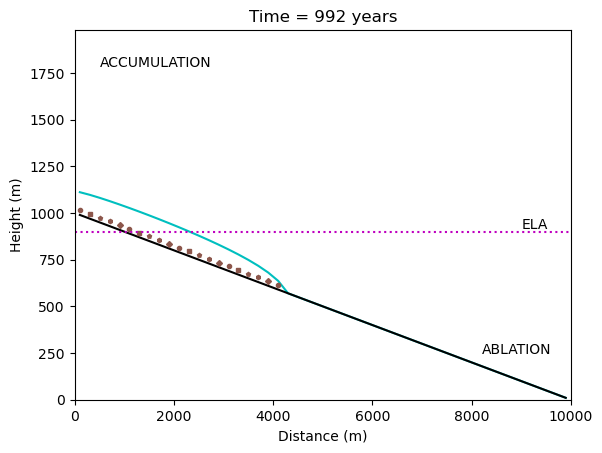

In [48]:
my_movie, model = run_model()
my_movie

## An example model run with a different ELA

Final glacier length: 8571.428571428572 m
Final maximum thickness: 177.6064788995503 m
Final maximum velocity: 51.88137193542978 m/yr
Final maximum ice specific discharge: 9014.244782377906 m2/yr
Final ice volume (per width): 1267471.8860927522 m2


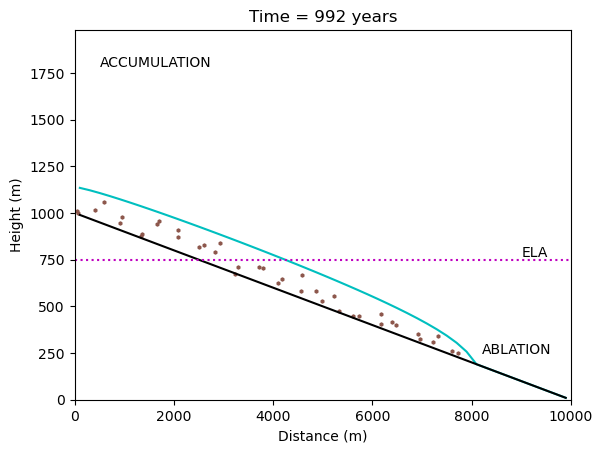

In [ ]:
my_movie, model = run_model(ela=750.0)
my_movie

## Example of plotting the ice thickness discharge

The `model` data object contains arrays for ice thickness and discharge at the end of the run. To plot ice thickness, use the `model.x` array for the locations of the model cells and the `model.ice_thickness` for the ice thickness at those locations:

Text(0, 0.5, 'Thickness (m)')

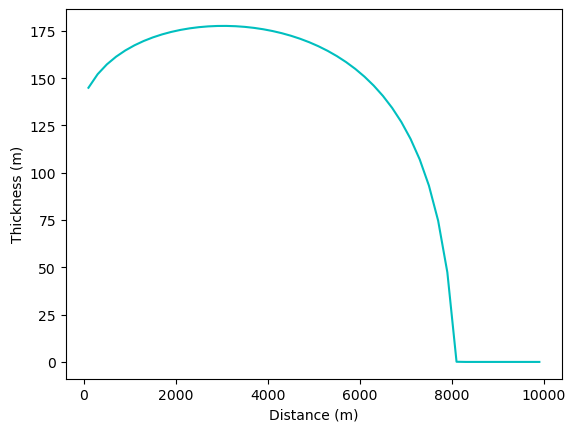

In [ ]:
plt.plot(model.x, model.ice_thickness, 'c')
plt.xlabel('Distance (m)')
plt.ylabel('Thickness (m)')

To plot ice discharge, use `model.x_edges` (the locations of the *edges* of the cells) and `model.q`, which is the ice discharge calculated *at the cell edges*.

Text(0, 0.5, 'Specific ice discharge (m2/yr)')

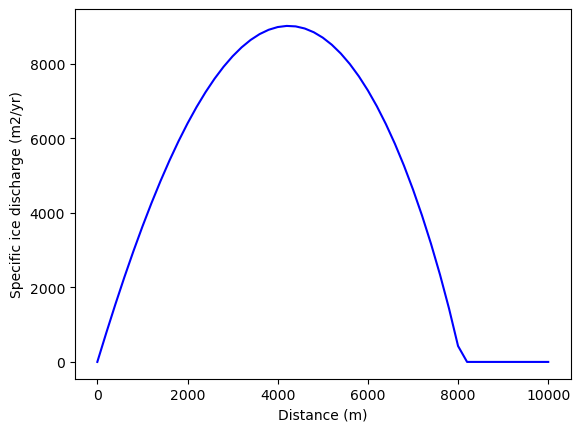

In [ ]:
plt.plot(model.x_edges, model.q, 'b')
plt.xlabel('Distance (m)')
plt.ylabel('Specific ice discharge (m2/yr)')

## Your turn

Use the cells below to experiment with running the model with different parameters and/or boundary conditions, as indicated in the assignment. To run the model and produce a movie, use `my_movie = run_model(`*keyword parameters*`)`, as in the example above. See the header of the `ValleyGlacierSimulator` class for a list of parameters and their default values.

### Type your code and notes in the cells below here:

I am envisioning a geologic scenario in which rapid tectonic uplift, driven by a continental-continental collision (analogous to the Himalaya) has led to high peaks, steep valleys, and pervasive glaciation. Global temperature has cooled due to an increase in silicate weathering, so the ELA is relatively low. However, temperatures are still warm enough to allow for some basal melting of alpine glaciers. Because regional gradients are steep, the accumulation rate coefficent is relatively high, indicating that changes in mass accumulation occur rapidly up and down the glacier profile.

Final glacier length: 5714.285714285714 m
Final maximum thickness: 102.38050366463321 m
Final maximum velocity: 147.184941001942 m/yr
Final maximum ice specific discharge: 15041.919808323153 m2/yr
Final ice volume (per width): 480026.82909274986 m2


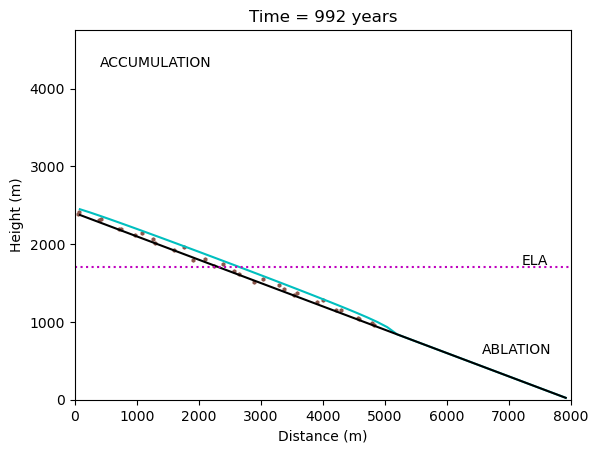

In [ ]:
my_movie_2, model_2 = run_model(valley_length = 8000, valley_slope = 0.3, ela = 1700, sliding_factor = 0.05, gamma = 0.014)
my_movie_2